In [57]:
import numpy as np
import scipy as sp
from scipy import signal
import sklearn as sk
from sklearn import neighbors
import preprocessing as pp
import utilities as u
import MAPInference as mapi
from matplotlib import pyplot as plt
import pickle
import os
from scipy.interpolate import interp1d as spline
from sklearn.linear_model import HuberRegressor as hreg
from sklearn.linear_model import LinearRegression as lreg
from sklearn.decomposition import PCA as pca
from scipy.optimize import minimize
import UnityTransforms as ut

import SimulatedSimMats as ssm

%matplotlib inline

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
df = pp.load_session_db(dir='D:\\')
# df = pp.load_session_db()
df = df[df['RewardCount']>40]
# df = df[df['Imaging']==1]
df = df.sort_values(['MouseName','DateTime','SessionNumber'])
df = df[df["Track"]=="TwoTower_foraging"]

In [ ]:
df_imag = df[df['Imaging']==1]
df_mouse = df_imag[df["MouseName"]=='4139265.5']
df_mouse

In [ ]:
mice = ['4139265.3','4139265.4','4139265.5','4222168.1','4343703.1','4343706','4222153.1','4222153.2',
        '4222153.3','4222174.1','4222154.1','4343702.1']

In [ ]:

def trial_info_to_stim(trial_info):
    wall = trial_info['morphs']+trial_info['wallJitter']
    bckgnd = trial_info['morphs']+trial_info['bckgndJitter']
    tower = np.minimum(np.maximum(trial_info['morphs']+trial_info['towerJitter'],0),1)

    return np.concatenate((ut.xfreq(wall)[:,np.newaxis],wall[:,np.newaxis],bckgnd[:,np.newaxis],tower[:,np.newaxis]),axis=1)

def trial_info_to_morph(trial_info):
    wall = trial_info['morphs']+trial_info['wallJitter']
    bckgnd = trial_info['morphs']+trial_info['bckgndJitter']
    tower = np.minimum(np.maximum(trial_info['morphs']+trial_info['towerJitter'],0),1)

    return np.concatenate((ut.wallmorphx(wall)[:,np.newaxis],wall[:,np.newaxis],ut.wallmorphy(wall)[:,np.newaxis],bckgnd[:,np.newaxis],tower[:,np.newaxis]),axis=1)
    
def single_session_data(sess):
#     print(sess)
    VRDat = pp.behavior_dataframe(sess["data file"])
    trial_info, tstarts_, teleports_ = u.by_trial_info(VRDat)
#     return trial_info_to_stim(trial_info)
    return trial_info_to_morph(trial_info)

def single_mouse_data(mouse,df_mouse):
#     df_mouse = df[df["MouseName"]==mouse]
    data = {}
    for i in range(df_mouse.shape[0]):
        sess = df_mouse.iloc[i]
        date, num = sess['DateFolder'],sess['SessionNumber']
        key = date + str(num) 
        
        data[key] = single_session_data(sess)
        
    return data

def single_mouse_em_all(mouse,data = None):
    if data is None:
        data = single_mouse_data(mouse,df[df["MouseName"]==mouse])
    else:
        pass
    
    for i, (key,arr) in enumerate(data.items()):
        if i == 0:
            em_all = arr
        else:
            em_all = np.concatenate((em_all,arr),axis=0)
    return em_all

def gaussian(mu,sigma,x):
    '''radial basis function centered at 'mu' with width 'sigma', sampled at 'x' '''
    return np.exp(-(mu-x)**2/sigma**2)


In [ ]:
mice = ['4139265.3','4139265.4','4139265.5','4222168.1','4343703.1','4343706','4222153.1','4222153.2',
        '4222153.3','4222174.1','4222154.1','4343702.1']
first_sessions = [5,5,5,3,5,2,4,4,4,4,4,4]
print(len(mice),len(first_sessions))
rare_mice,freq_mice = mice[:6],mice[6:]
rare_fs, freq_fs = first_sessions[:6],first_sessions[6:]


# run all 8-N sessions

In [17]:
def single_mouse_sf_regression(mouse,df,first_ind=5,sigma_prior=.1,sigma_likelihood=.3,
                              x = np.linspace(-.3,1.3,num=1000)[np.newaxis,:],
                               mus = np.linspace(-.3,1.3,num=1000)[:,np.newaxis],
                              plot=False):
    behav_sessions = df[df["MouseName"]==mouse]
    imag_sessions = behav_sessions[behav_sessions["Imaging"]==1]
    imag_sessions = imag_sessions[(imag_sessions['ImagingRegion']=='CA1' )|(imag_sessions['ImagingRegion']=='')]
    morph_data = single_mouse_data(mouse,behav_sessions)
    
    WALLMORPH,WALLMORPH_UC, RARE_YTARGET, FREQ_YTARGET,RARE_YHAT,FREQ_YHAT, PRIORS, PRIORS_UC,SF,SFHAT = [],[],[],[],[],[],[],[],[],[]
    
    for ind in range(first_ind,imag_sessions.shape[0]):
        sess = imag_sessions.iloc[ind]
        
        print(ind)
        # calculate cumulative prior up to current session
        date_folder,sessn = None,-np.inf
        em_all = None
        b_ind = 0
        while date_folder!=sess['DateFolder'] or sessn<sess["SessionNumber"]:
            b_sess = behav_sessions.iloc[b_ind]
            date_folder = b_sess['DateFolder']
            sessn = b_sess['SessionNumber']
            if em_all is None:
                em_all = morph_data[date_folder+str(sessn)]
            else:
                em_all = np.concatenate((em_all,morph_data[date_folder+str(sessn)]),axis=0)
            b_ind+=1


        em_1d = em_all[:,:1]
        prior = np.mean(u.gaussian(em_1d,sigma_prior,x),axis=0,keepdims=True)
        PRIORS.append(prior)
        prior_spl = lambda x: np.mean(u.gaussian(em_1d,sigma_prior,x),axis=0,keepdims=True)
        
        em_uc = em_all[:,1:2]
        prior_uc = np.mean(u.gaussian(em_uc,sigma_prior,x),axis=0,keepdims=True)
        PRIORS_UC.append(prior_uc)



        # load data
        with open(os.path.join("D:\\Suite2P_Data\\",sess["MouseName"],"%s_%s_%i.pkl" % (sess["Track"],sess["DateFolder"],sess["SessionNumber"])),'rb') as f:
            data = pickle.load(f)
        VRDat,S = data['VRDat'],data['S']
        S[np.isnan(S)]=0
        S = S/np.percentile(S,95,axis=0)
        trial_info,S_trial_mat= data['trial_info'],data['S_trial_mat']
        S_trial_mat[np.isnan(S_trial_mat)]=0


        # similarity fraction
        sf = u.similarity_fraction(S_trial_mat,trial_info)
        SF.append(sf)

        morphmat = trial_info_to_morph(data['trial_info'])
        wallMorph = morphmat[:,0]
        WALLMORPH.append(wallMorph)
        WALLMORPH_UC.append(data['trial_info']['morphs']+data['trial_info']['wallJitter'])
    
        rare_yhat = (sf- np.median(sf[trial_info['morphs']==0]))/(np.median(sf[trial_info['morphs']==1])-np.median(sf[trial_info['morphs']==0]))*(1.073-.094) +.094 #(38.051-10.537) + 10.537 #
#         rare_yhat = np.minimum(np.maximum(rare_yhat,-.3),1.3)
        rare_yhat = np.clip(rare_yhat,-.3,1.3)
        freq_yhat = (sf- np.median(sf[trial_info['morphs']==0]))/(np.median(sf[trial_info['morphs']==1])-np.median(sf[trial_info['morphs']==0]))*(1.073-.094) +.094 #(38.051-10.537) + 10.537 #(1.073-.093) +.093
#         freq_yhat = np.minimum(np.maximum(freq_yhat,-.3),1.3)
        freq_yhat = np.clip(freq_yhat,-.3,1.3)
         # need to add cross val
#         rare_ytarget = x[0,np.argmax(rare_prior_spl(x)*gaussian(wallMorph[:,np.newaxis],sigma_likelihood,x),axis=1)].ravel()
#         freq_ytarget = x[0,np.argmax(freq_prior_spl(x)*gaussian(wallMorph[:,np.newaxis],sigma_likelihood,x),axis=1)].ravel()
#         rare_yhat,freq_yhat = np.zeros(rare_ytarget.shape),np.zeros(rare_ytarget.shape)
#         for trial in range(rare_yhat.shape[0]):
#             train = np.ones(rare_yhat.shape)>0
#             train[trial]= False
#             linmodel = hreg().fit(sf[train,np.newaxis],rare_ytarget[train].ravel())
#             rare_yhat[trial]=linmodel.predict(sf[trial].reshape(-1,1))
            
#             linmodel = hreg().fit(sf[train,np.newaxis],freq_ytarget[train].ravel())
#             freq_yhat[trial] = linmodel.predict(sf[trial].reshape(-1,1))
            
#         RARE_YTARGET.append(rare_ytarget)
#         FREQ_YTARGET.append(freq_ytarget)
        RARE_YHAT.append(rare_yhat)
        FREQ_YHAT.append(freq_yhat)

#         YHAT.append(yhat)
#         SFHAT.append(sfhat)
#         YTARGET.append(ytarget)
    return {'wallmorph':WALLMORPH, 'rare_ytarget':RARE_YTARGET,'freq_ytarget':FREQ_YTARGET,'rare_yhat': RARE_YHAT, 'freq_yhat':FREQ_YHAT,'priors':PRIORS,'priors_uc':PRIORS_UC,'sf': SF,'sfhat':SFHAT,'wallmorph_uc':WALLMORPH_UC}
       
        
#     return {'wallmorph':WALLMORPH, 'ytarget':YTARGET,'yhat': YHAT, 'priors':PRIORS,'sf': SF,'sfhat':SFHAT,'wallmorph_uc':WALLMORPH_UC}

In [18]:
def firstsess_sf_regression(mouse,df,first_ind=2,sigma_prior=.1,sigma_likelihood=.3,
                              x = np.linspace(-.3,1.3,num=1000)[np.newaxis,:],
                               mus = np.linspace(-.3,1.3,num=1000)[:,np.newaxis],
                              plot=False):
    behav_sessions = df[df["MouseName"]==mouse]
    imag_sessions = behav_sessions[behav_sessions["Imaging"]==1]
    imag_sessions = imag_sessions[(imag_sessions['ImagingRegion']=='CA1' )|(imag_sessions['ImagingRegion']=='')]
    morph_data = single_mouse_data(mouse,behav_sessions)
    
#     WALLMORPH,WALLMORPH_UC, RARE_YTARGET, FREQ_YTARGET,RARE_YHAT,FREQ_YHAT, PRIORS, PRIORS_UC,SF,SFHAT = [],[],[],[],[],[],[],[],[],[]
    
    sess = imag_sessions.iloc[first_ind]

#     print(ind)
    # calculate cumulative prior up to current session
    date_folder,sessn = None,-np.inf
    em_all = None
    b_ind = 0
    while date_folder!=sess['DateFolder'] or sessn<sess["SessionNumber"]:
        b_sess = behav_sessions.iloc[b_ind]
        date_folder = b_sess['DateFolder']
        sessn = b_sess['SessionNumber']
        if em_all is None:
            em_all = morph_data[date_folder+str(sessn)]
        else:
            em_all = np.concatenate((em_all,morph_data[date_folder+str(sessn)]),axis=0)
        b_ind+=1


    em_1d = em_all[:,:1]
    prior = np.mean(u.gaussian(em_1d,sigma_prior,x),axis=0,keepdims=True)
#     PRIORS.append(prior)
    prior_spl = lambda x: np.mean(u.gaussian(em_1d,sigma_prior,x),axis=0,keepdims=True)

    em_uc = em_all[:,1:2]
    prior_uc = np.mean(u.gaussian(em_uc,sigma_prior,x),axis=0,keepdims=True)
#     PRIORS_UC.append(prior_uc)



    # load data
    with open(os.path.join("D:\\Suite2P_Data\\",sess["MouseName"],"%s_%s_%i.pkl" % (sess["Track"],sess["DateFolder"],sess["SessionNumber"])),'rb') as f:
        data = pickle.load(f)
    VRDat,S = data['VRDat'],data['S']
    S[np.isnan(S)]=0
    S = S/np.percentile(S,95,axis=0)
    trial_info,S_trial_mat= data['trial_info'],data['S_trial_mat']
    S_trial_mat[np.isnan(S_trial_mat)]=0


    # similarity fraction
    sf = u.similarity_fraction(S_trial_mat,trial_info)
#     SF.append(sf)

    morphmat = trial_info_to_morph(data['trial_info'])
    wallMorph = morphmat[:,0]
#     WALLMORPH.append(wallMorph)
#     WALLMORPH_UC.append(data['trial_info']['morphs']+data['trial_info']['wallJitter'])

    rare_yhat = (sf- np.median(sf[trial_info['morphs']==0]))/(np.median(sf[trial_info['morphs']==1])-np.median(sf[trial_info['morphs']==0]))*(1.073-.094) +.094 #(38.051-10.537) + 10.537 #
    rare_yhat = np.clip(rare_yhat,-.3,1.3)
    freq_yhat = (sf- np.median(sf[trial_info['morphs']==0]))/(np.median(sf[trial_info['morphs']==1])-np.median(sf[trial_info['morphs']==0]))*(1.073-.094) +.094 #(38.051-10.537) + 10.537 #(1.073-.093) +.093
    freq_yhat = np.clip(freq_yhat,-.3,1.3)
    
#     RARE_YHAT.append(rare_yhat)
#     FREQ_YHAT.append(freq_yhat)

    return {'wallmorph':wallMorph,'rare_yhat': rare_yhat, 'freq_yhat':freq_yhat,'prior':prior,'prior_uc':prior_uc,'sf': sf,'wallmorph_uc':data['trial_info']['morphs']+data['trial_info']['wallJitter']}
       
        

In [19]:
rare_fs_sfreg = {mouse:firstsess_sf_regression(mouse,df,first_ind=fs) for (mouse,fs) in zip(rare_mice[:-1],[2,2,2,0,1])}
freq_fs_sfreg = {mouse:firstsess_sf_regression(mouse,df,first_ind=fs) for (mouse,fs) in zip(freq_mice,[1,1,1,1,1,1])}

C:\Users\markp\anaconda3\lib\site-packages\pandas\core\frame.py:4244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  **kwargs


deleting last index from trial start
deleting last index from trial start


C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:46: RuntimeWarning: divide by zero encountered in true_divide
C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in true_divide


In [20]:
rare_sfreg = {mouse:single_mouse_sf_regression(mouse,df,first_ind=fs) for (mouse,fs) in zip(rare_mice,rare_fs)}
freq_sfreg = {mouse:single_mouse_sf_regression(mouse,df,first_ind=4) for mouse in freq_mice}

5
6
7
8
9
5
6
7
8
9
10
5
6
7
8
9
deleting last index from trial start
deleting last index from trial start
3
4
5
6
5
2
3
4
4
5
6
4
5
6
7
4
4
5
6
7
8
4
5
6
7
8
4
5
6


In [21]:
with open("D:\\Morph_Results\\rare_sf_regression.pkl",'wb') as f:
    pickle.dump(rare_sfreg,f)
    
with open("D:\\Morph_Results\\freq_sf_regression.pkl",'wb') as f:
    pickle.dump(freq_sfreg,f)

In [22]:
with open("D:\\Morph_Results\\rare_sf_regression.pkl",'rb') as f:
    rare_sfreg = pickle.load(f)
    
with open("D:\\Morph_Results\\freq_sf_regression.pkl",'rb') as f:
    freq_sfreg = pickle.load(f)

In [23]:
def first_prior_post(dict_sfreg,sigma_likelihood=.3,x=np.linspace(-.3,1.3,num=1000)[np.newaxis,:]):
    mice = [mouse for mouse in dict_sfreg.keys()]
    priors,priors_uc = np.zeros([len(mice),x.shape[1]]),np.zeros([len(mice),x.shape[1]])
    for i, (mouse,res) in enumerate(dict_sfreg.items()):
        _prior,_prior_uc=None,None
        for _p,_puc in zip(res['priors'],res['priors_uc']):
            if _prior is None:
                _prior = _p
                _prior_uc=_puc
            else:
#                 pass
                _prior+=_p
        _prior = _prior/_prior.sum()
        priors[i,:]=_prior
        priors_uc[i,:]=_prior_uc/_prior_uc.sum()
        
    prior = _prior.mean(axis=0,keepdims=True)
    prior = prior/prior.sum()
    post = prior*gaussian(x.T,sigma_likelihood,x)
    post = post/post.sum(axis=1)
    
    post_uc = prior*gaussian(ut.wallmorphx(x.T),sigma_likelihood,x)
    post_uc = post_uc/post_uc.sum(axis=1)
    return priors, prior, post,priors_uc, post_uc

In [24]:
rare_priors,rare_prior,rare_post , rare_prior_uc,rare_post_uc= first_prior_post(rare_sfreg)
freq_priors,freq_prior,freq_post, freq_prior_uc , freq_post_uc= first_prior_post(freq_sfreg)
xx = np.linspace(-.3,1.3,num=1000)
rare_prior_spl = spline(xx.ravel(),rare_prior.ravel())
freq_prior_spl = spline(xx.ravel(),freq_prior.ravel())

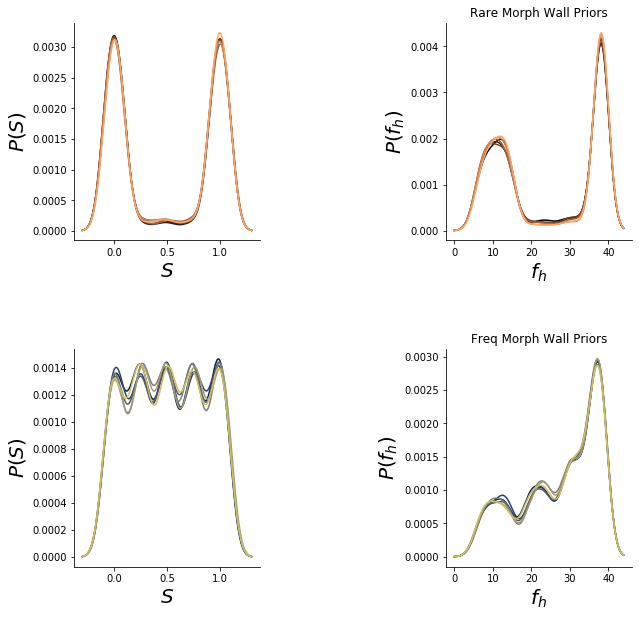

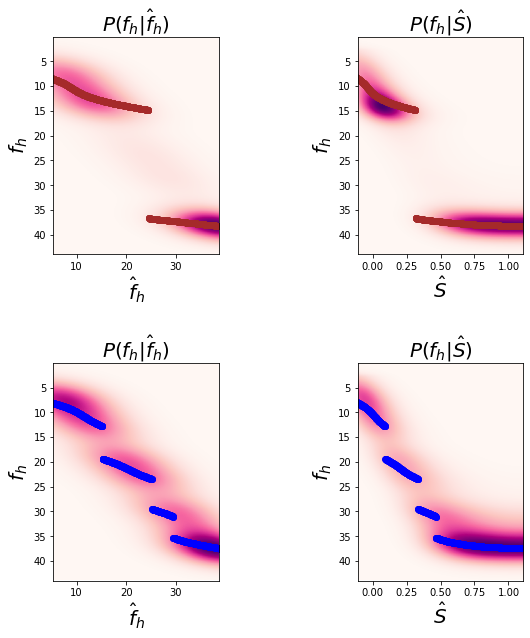

In [25]:
x = np.linspace(-.3,1.3,num=1000)[np.newaxis,:]
f,ax = plt.subplots(2,2,figsize=[10,10])
for row in range(rare_priors.shape[0]):
    ax[0,0].plot(x.ravel(),rare_prior_uc[row,:].ravel(),color=plt.cm.copper(np.float(row)/np.float(len(rare_mice))))
    ax[0,1].plot(ut.inv_wallmorphx(x.ravel()),rare_priors[row,:].ravel(),color=plt.cm.copper(np.float(row)/np.float(len(rare_mice))))

for row in range(freq_priors.shape[0]):
    ax[1,0].plot(x.ravel(),freq_prior_uc[row,:].ravel(),color=plt.cm.cividis(np.float(row)/np.float(len(freq_mice))))
    ax[1,1].plot(ut.inv_wallmorphx(x.ravel()),freq_priors[row,:].ravel(),color=plt.cm.cividis(np.float(row)/np.float(len(freq_mice))))

f.subplots_adjust(hspace=.5)
# ax[0].plot(x.ravel(),rare_prior.ravel(),color='brown',linewidth=5)
ax[0,0].set_xlabel("$S$",fontsize=20)
ax[0,0].set_ylabel("$P(S)$",fontsize=20)
ax[0,1].set_xlabel("$f_h$",fontsize=20)
ax[0,1].set_ylabel("$P(f_h)$",fontsize=20)
ax[0,1].set_title('Rare Morph Wall Priors')
# ax[1].plot(x.ravel(),freq_prior.ravel(),color='blue',linewidth=5)
ax[1,0].set_xlabel("$S$",fontsize=20)
ax[1,0].set_ylabel("$P(S)$",fontsize=20)
ax[1,1].set_xlabel("$f_h$",fontsize=20)
ax[1,1].set_ylabel("$P(f_h)$",fontsize=20)
ax[1,1].set_title('Freq Morph Wall Priors')
f.subplots_adjust(wspace=1)

ax[0,0].spines['top'].set_visible(False)
ax[0,0].spines['right'].set_visible(False)
ax[0,1].spines['top'].set_visible(False)
ax[0,1].spines['right'].set_visible(False)
ax[1,0].spines['top'].set_visible(False)
ax[1,0].spines['right'].set_visible(False)
ax[1,1].spines['top'].set_visible(False)
ax[1,1].spines['right'].set_visible(False)




# f.savefig("D:\\Morph_Results\\priors.pdf",format="pdf")
log_rare_post,log_freq_post = np.log(rare_post), np.log(freq_post)
rare_ytarget = ut.inv_wallmorphx(x[0,np.argmax(rare_prior*u.gaussian(xx[:,np.newaxis],.3,x),axis=1)].ravel())
rare_ytarget_uc = ut.inv_wallmorphx(x[0,np.argmax(rare_prior*u.gaussian(ut.wallmorphx(xx[:,np.newaxis]),.3,x),axis=1)].ravel())
freq_ytarget = ut.inv_wallmorphx(x[0,np.argmax(freq_prior*u.gaussian(xx[:,np.newaxis],.3,x),axis=1)].ravel())
freq_ytarget_uc = ut.inv_wallmorphx(x[0,np.argmax(freq_prior*u.gaussian(ut.wallmorphx(xx[:,np.newaxis]),.3,x),axis=1)].ravel())

f,ax = plt.subplots(2,2,figsize=[10,10])
f.subplots_adjust(hspace=.5)
low,high = ut.inv_wallmorphx(-.3),ut.inv_wallmorphx(1.3)
ax[0,0].imshow(rare_post.T,cmap='RdPu',extent=[low,high,high,low],vmin=np.percentile(rare_post,20))
ax[0,0].scatter(ut.inv_wallmorphx(x),rare_ytarget,color='brown')
ax[0,0].set_xlim([ut.inv_wallmorphx(-.11),ut.inv_wallmorphx(1.11)])
ax[0,0].set_xlabel("$\hat{f}_{h}$",fontsize=20)
ax[0,0].set_ylabel("$f_{h}$",fontsize=20)
ax[0,0].set_title("$P(f_h|\hat{f}_h)$",fontsize=20)

# ax[0,1].imshow(log_rare_post.T,cmap='RdPu',extent=[low,high,high,low],vmin=np.percentile(log_rare_post,20))
ax[0,1].imshow(rare_post_uc.T,cmap='RdPu',extent=[-.3,1.3,high,low],vmin=np.percentile(rare_post_uc,20),aspect=(1.6)/(high-low))
ax[0,1].scatter(xx,rare_ytarget_uc,color='brown')
# ax[0,1].set_xlim([ut.inv_wallmorphx(-.11),ut.inv_wallmorphx(1.11)])
ax[0,1].set_xlim([-.11,1.11])
ax[0,1].set_xlabel("$\hat{S}$",fontsize=20)
ax[0,1].set_ylabel("$f_{h}$",fontsize=20)
ax[0,1].set_title("$P(f_h|\hat{S})$",fontsize=20)
# ax[0,1].set_title("$log[P(f_h|\hat{f}_h)]$",fontsize=20)


ax[1,0].imshow(freq_post.T,cmap='RdPu',extent=[low,high,high,low],vmin=np.percentile(freq_post,20))
ax[1,0].scatter(ut.inv_wallmorphx(x),freq_ytarget,color='blue')
ax[1,0].set_xlim([ut.inv_wallmorphx(-.11),ut.inv_wallmorphx(1.11)])
ax[1,0].set_xlabel("$\hat{f}_{h}$",fontsize=20)
ax[1,0].set_ylabel("$f_{h}$",fontsize=20)
ax[1,0].set_title("$P(f_h|\hat{f}_h)$",fontsize=20)

# ax[1,1].imshow(log_freq_post.T,cmap='RdPu',extent=[low,high,high,low],vmin=np.percentile(log_freq_post,20))
ax[1,1].imshow(freq_post_uc.T,cmap='RdPu',extent=[-.3,1.3,high,low],vmin=np.percentile(freq_post_uc,20),aspect=(1.6)/(high-low))
ax[1,1].scatter(x,freq_ytarget_uc,color='blue')
ax[1,1].set_xlim([-.11,1.11])
ax[1,1].set_xlabel("$\hat{S}$",fontsize=20)
ax[1,1].set_ylabel("$f_{h}$",fontsize=20)
ax[1,1].set_title("$P(f_h|\hat{S})$",fontsize=20)

f.savefig("D:\\Morph_Results\\posteriors.pdf",format="pdf")

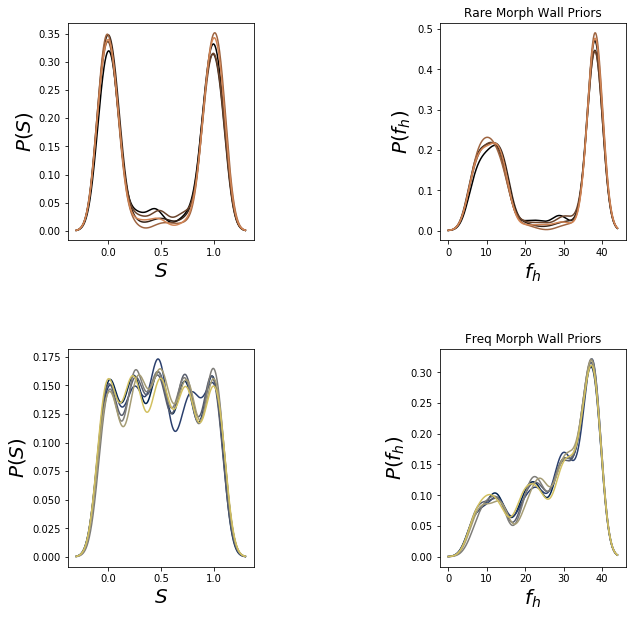

In [26]:
x = np.linspace(-.3,1.3,num=1000)[np.newaxis,:]
f,ax = plt.subplots(2,2,figsize=[10,10])
for i, (mouse,d) in enumerate(rare_fs_sfreg.items()):
    ax[0,0].plot(x.ravel(),d['prior_uc'].ravel(),color=plt.cm.copper(np.float(i)/6))
    ax[0,1].plot(ut.inv_wallmorphx(x.ravel()),d['prior'].ravel(),color=plt.cm.copper(np.float(i)/6))

for i, (mouse,d) in enumerate(freq_fs_sfreg.items()):
    ax[1,0].plot(x.ravel(),d['prior_uc'].ravel(),color=plt.cm.cividis(np.float(i)/6))
    ax[1,1].plot(ut.inv_wallmorphx(x.ravel()),d['prior'].ravel(),color=plt.cm.cividis(np.float(i)/6))

f.subplots_adjust(hspace=.5)
# ax[0].plot(x.ravel(),rare_prior.ravel(),color='brown',linewidth=5)
ax[0,0].set_xlabel("$S$",fontsize=20)
ax[0,0].set_ylabel("$P(S)$",fontsize=20)
ax[0,1].set_xlabel("$f_h$",fontsize=20)
ax[0,1].set_ylabel("$P(f_h)$",fontsize=20)
ax[0,1].set_title('Rare Morph Wall Priors')
# ax[1].plot(x.ravel(),freq_prior.ravel(),color='blue',linewidth=5)
ax[1,0].set_xlabel("$S$",fontsize=20)
ax[1,0].set_ylabel("$P(S)$",fontsize=20)
ax[1,1].set_xlabel("$f_h$",fontsize=20)
ax[1,1].set_ylabel("$P(f_h)$",fontsize=20)
ax[1,1].set_title('Freq Morph Wall Priors')
f.subplots_adjust(wspace=1)

f.savefig("D:\\Morph_Results\\firstsess_priors.pdf",format="pdf")

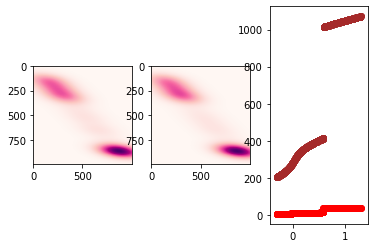

In [27]:
rare_fs_prior = 0
x=np.linspace(-.3,1.3,num=1000)[np.newaxis,:]
for m,d in rare_fs_sfreg.items():
    rare_fs_prior+=d['prior']
rare_fs_prior/=rare_fs_prior.sum()
rare_fs_post = rare_fs_prior*u.gaussian(x.T,.3,x)
rare_fs_post = rare_fs_post/rare_fs_post.sum(axis=1)
rare_fs_ytarget = ut.inv_wallmorphx(x[0,np.argmax(rare_fs_prior*u.gaussian(xx[:,np.newaxis],.3,x),axis=1)].ravel())

f,ax = plt.subplots(1,3)
ax[0].imshow(rare_fs_post.T,cmap='RdPu')

ax[1].imshow(rare_post.T,cmap='RdPu')
ax[2].scatter(xx,rare_fs_ytarget,color='red')
ax[2].scatter(xx,ut.inv_wallmorphx(rare_ytarget),color='brown')


freq_fs_prior = 0
x=np.linspace(-.3,1.3,num=1000)[np.newaxis,:]
for m,d in freq_fs_sfreg.items():
    freq_fs_prior+=d['prior']
freq_fs_prior/=freq_fs_prior.sum()
freq_fs_post = freq_fs_prior*u.gaussian(x.T,.3,x)
freq_fs_post = freq_fs_post/freq_fs_post.sum(axis=1)
freq_fs_ytarget = ut.inv_wallmorphx(x[0,np.argmax(freq_fs_prior*u.gaussian(xx[:,np.newaxis],.3,x),axis=1)].ravel())

In [28]:
rare_post_spl = sp.interpolate.interp2d(xx.ravel(),xx.ravel(),rare_post.T)
freq_post_spl = sp.interpolate.interp2d(xx.ravel(),xx.ravel(),freq_post.T)

In [12]:
print(rare_post_spl(.5,x.ravel()).shape)

(1000, 1)


In [51]:
sigma_likelihood=.3

def plot_sfreg(sfreg,cmap):
    cmap = plt.cm.get_cmap(cmap)
    low,high = ut.inv_wallmorphx(-.3),ut.inv_wallmorphx(1.3)
    x = np.linspace(-.3,1.3,num=1000)[np.newaxis,:]
#     rare_post,xx,Z = ssm.calculate_posterior(rare_prior,x.ravel(),xx_lims = (-.3,1.3),calcZ=True)
#     rareZspline = spline(x.ravel(),Z)

#     freq_post,xx,Z = ssm.calculate_posterior(freq_prior,x.ravel(),xx_lims = (-.3,1.3),calcZ=True)
#     freqZspline = spline(x.ravel(),Z)
    f,ax = plt.subplots(2,3,figsize=[30,20])

    rare_logpost = np.log(rare_post.T)
    # rare_logpost_spline()
    ax[0,0].imshow(rare_logpost,vmin=np.percentile(rare_logpost,20),extent =[low,high,high,low],cmap='RdPu')
    ax[0,1].imshow(rare_post.T,vmin=np.percentile(rare_post,5),extent =[low,high,high,low],cmap='RdPu')
    ax[0,2].plot(ut.inv_wallmorphx(x.ravel()),rare_prior.ravel(),color='brown',linewidth=5)
    ax[0,2].plot(ut.inv_wallmorphx(x.ravel()),freq_prior.ravel(),color='blue',linewidth=5)

    freq_logpost = np.log(freq_post.T)
    ax[1,0].imshow(freq_logpost,vmin=np.percentile(freq_logpost,20),extent =[low,high,high,low],cmap='RdPu')
    ax[1,1].imshow(freq_post.T,vmin=np.percentile(freq_post,5),extent =[low,high,high,low],cmap='RdPu')
    ax[1,2].plot(ut.inv_wallmorphx(x.ravel()),freq_prior.ravel(),color='blue',linewidth=5)
    
    kllist = []
    trialn = 0
    for i, (mouse, res) in enumerate(sfreg.items()):
#         print(res['wallmorph'])
        try:
            _wallmorph = np.concatenate(res['wallmorph'])
            rare_yhat = np.concatenate(res['rare_yhat'])
            freq_yhat = np.concatenate(res['freq_yhat'])
        except:
            _wallmorph = res['wallmorph']
            rare_yhat = res['rare_yhat']
            freq_yhat = res['freq_yhat']
        ax[0,0].scatter(ut.inv_wallmorphx(_wallmorph),ut.inv_wallmorphx(rare_yhat),color=cmap(np.float(i/len(rare_mice))),alpha=.5)
        ax[0,1].scatter(ut.inv_wallmorphx(_wallmorph),ut.inv_wallmorphx(rare_yhat),color=cmap(np.float(i/len(rare_mice))),alpha=.5)
        ax[1,0].scatter(ut.inv_wallmorphx(_wallmorph),ut.inv_wallmorphx(freq_yhat),color=cmap(np.float(i/len(rare_mice))),alpha=.5)
        ax[1,1].scatter(ut.inv_wallmorphx(_wallmorph),ut.inv_wallmorphx(freq_yhat),color=cmap(np.float(i/len(rare_mice))),alpha=.5)

        _x = x.ravel()
        wmsm = u.gaussian(_wallmorph[:,np.newaxis,np.newaxis],.1,_x[np.newaxis,:,np.newaxis])
        rare_yhsm = u.gaussian(rare_yhat[:,np.newaxis,np.newaxis],.1,_x[np.newaxis,np.newaxis,:])
        rare_H = np.sum(wmsm*rare_yhsm,axis=0)
        Z = rare_H.sum(axis=1)
        rare_H/=rare_H.sum(axis=1,keepdims=True)
        rare_H_prior =rare_H.sum(axis=0)/(u.gaussian(x,sigma_likelihood,_x[:,np.newaxis])/Z[:,np.newaxis]).sum(axis=1)
        rare_H_prior /=rare_H_prior.sum()

        freq_yhsm = u.gaussian(freq_yhat[:,np.newaxis,np.newaxis],.1,_x[np.newaxis,np.newaxis,:])
        freq_H = np.sum(wmsm*freq_yhsm,axis=0)
        Z = freq_H.sum(axis=1)
        freq_H/=freq_H.sum(axis=1,keepdims=True)
        freq_H_prior =freq_H.sum(axis=0)/(u.gaussian(x,sigma_likelihood,_x[:,np.newaxis])/Z[:,np.newaxis]).sum(axis=1)
        freq_H_prior /=freq_H_prior.sum()

        ax[0,2].plot(ut.inv_wallmorphx(x.ravel()),rare_H_prior,color=cmap(np.float(i/len(rare_mice))))
        ax[1,2].plot(ut.inv_wallmorphx(x.ravel()),freq_H_prior,color=cmap(np.float(i/len(rare_mice))))
        
        
        rarekl,freqkl = sp.stats.entropy(rare_prior.ravel(),rare_H_prior,base=2),sp.stats.entropy(freq_prior.ravel(),freq_H_prior,base=2)
        print(mouse,rarekl-freqkl)
        kllist.append(rarekl-freqkl)
        trialn+=_wallmorph.shape[0]
#     #     print(np.median(rare_entr-freq_entr))

    print('trial N', trialn)

    # xx = np.linspace(-.1,1.1,num=1000)
    mask = x<np.inf
    xf = ut.inv_wallmorphx(x)
    mask[(xf<ut.xfreq(-.1)) | ((xf>ut.xfreq(.1))&(xf<ut.xfreq(.15))) | ((xf>ut.xfreq(.35))&(xf<ut.xfreq(.4))) | ((xf>ut.xfreq(.6))&(xf<ut.xfreq(.65))) |((xf>ut.xfreq(.85))&(xf<ut.xfreq(.9))) |(xf>ut.xfreq(1.1))]=False
    mask = mask.ravel()
    # mask[]
    rare_ytarget = ut.inv_wallmorphx(x[0,np.argmax(rare_prior*u.gaussian(xx[:,np.newaxis],sigma_likelihood,x),axis=1)].ravel())
    ax[0,0].scatter(ut.inv_wallmorphx(xx[mask]),rare_ytarget[mask],color='brown',zorder=100)
    ax[0,1].scatter(ut.inv_wallmorphx(xx[mask]),rare_ytarget[mask],color='brown',zorder=100)

    freq_ytarget = ut.inv_wallmorphx(x[0,np.argmax(freq_prior*u.gaussian(xx[:,np.newaxis],sigma_likelihood,x),axis=1)].ravel())
    ax[1,0].scatter(ut.inv_wallmorphx(xx[mask]),freq_ytarget[mask],color='blue',zorder=100)
    ax[1,1].scatter(ut.inv_wallmorphx(xx[mask]),freq_ytarget[mask],color='blue',zorder=100)


    ax[0,0].set_xlabel("$\hat{f}_h$",fontsize=30)
    ax[0,0].set_ylabel("$f_h$",fontsize=30)
    ax[0,0].set_title("$Ideal \  Rare \ log(P(f_h|\hat{f}_h))$",fontsize=30)
    ax[0,0].set_xlim([ut.xfreq(-.11),ut.xfreq(1.11)])
    ax[0,0].set_ylim([high,low])

    ax[0,1].set_xlabel("$\hat{f}_h$",fontsize=30)
    ax[0,1].set_ylabel("$f_h$",fontsize=30)
    ax[0,1].set_title("$Ideal \  Rare \ P(f_h|\hat{f}_h)$",fontsize=30)
    ax[0,1].set_xlim([ut.xfreq(-.11),ut.xfreq(1.11)])
    ax[0,1].set_ylim([high,low])

    ax[0,2].set_xlabel("$f_h$",fontsize=30)
    ax[0,2].set_ylabel("$P(f_h)$",fontsize=30)
    ax[0,2].set_title("Reconstructed Prior vs Ideal Rare Prior",fontsize=30)
#     ax[0,2].set_xlim([-.11,1.11])

    ax[1,0].set_xlabel("$\hat{f}_h$",fontsize=30)
    ax[1,0].set_ylabel("$f_h$",fontsize=30)
    ax[1,0].set_title("$Ideal \ Freq. \ log(P(f_h|\hat{f}_h))$",fontsize=30)
    ax[1,0].set_xlim([ut.xfreq(-.11),ut.xfreq(1.11)])
    ax[1,0].set_ylim([high,low])
#
    ax[1,1].set_xlabel("$\hat{f}_h$",fontsize=30)
    ax[1,1].set_ylabel("$f_h$",fontsize=30)
    ax[1,1].set_title("$Ideal \ Freq. \ P(f_h|\hat{f}_h)$",fontsize=30)
    ax[1,1].set_xlim([ut.xfreq(-.11),ut.xfreq(1.11)])
    ax[1,1].set_ylim([high,low])

    ax[1,2].set_xlabel("$f_h$",fontsize=30)
    ax[1,2].set_ylabel("$P(f_h)$",fontsize=30)
    ax[1,2].set_title("Reconstructed Prior vs Ideal Freq. Prior",fontsize=30)
    return f,ax, kllist


# f.savefig("D:\\Morph_Results\\figures\\rare_sf_reg_density.png",format="png")
# f.savefig("D:\\Morph_Results\\figures\\rare_sf_reg_density.pdf",format="pdf")

# add estimated density from plotted points
# calculate correlation with either rare or frequent

In [52]:
mask = x>np.inf
mask[(ut.inv_wallmorphx(x)>ut.xfreq(-.1))&(ut.inv_wallmorphx(x)<ut.xfreq(.1)) ]=True
mask=mask.ravel()
rare_ytarget = x[0,np.argmax(rare_prior*gaussian(xx[:,np.newaxis],sigma_likelihood,x),axis=1)].ravel()
freq_ytarget = x[0,np.argmax(freq_prior*gaussian(xx[:,np.newaxis],sigma_likelihood,x),axis=1)].ravel()
print(rare_ytarget[mask].mean(),freq_ytarget[mask].mean(),.5*(rare_ytarget[mask].mean()+freq_ytarget[mask].mean()))
mask = x>np.inf
mask[(ut.inv_wallmorphx(x)>ut.xfreq(.9))&(ut.inv_wallmorphx(x)<ut.xfreq(1.1)) ]=True
mask=mask.ravel()
print(rare_ytarget[mask].mean(),freq_ytarget[mask].mean(),.5*(rare_ytarget[mask].mean()+freq_ytarget[mask].mean()))


0.10190365804400893 0.0856558312698664 0.09377974465693767
1.0883357041251778 1.0579895685158847 1.0731626363205313


4139265.3 -0.14532990207119223
4139265.4 -0.06417468934843648
4139265.5 -0.6627579834954505
4222168.1 -0.5307209075331604
4343703.1 -0.5936332985372345
4343706 -0.8124002716330893
trial N 2610


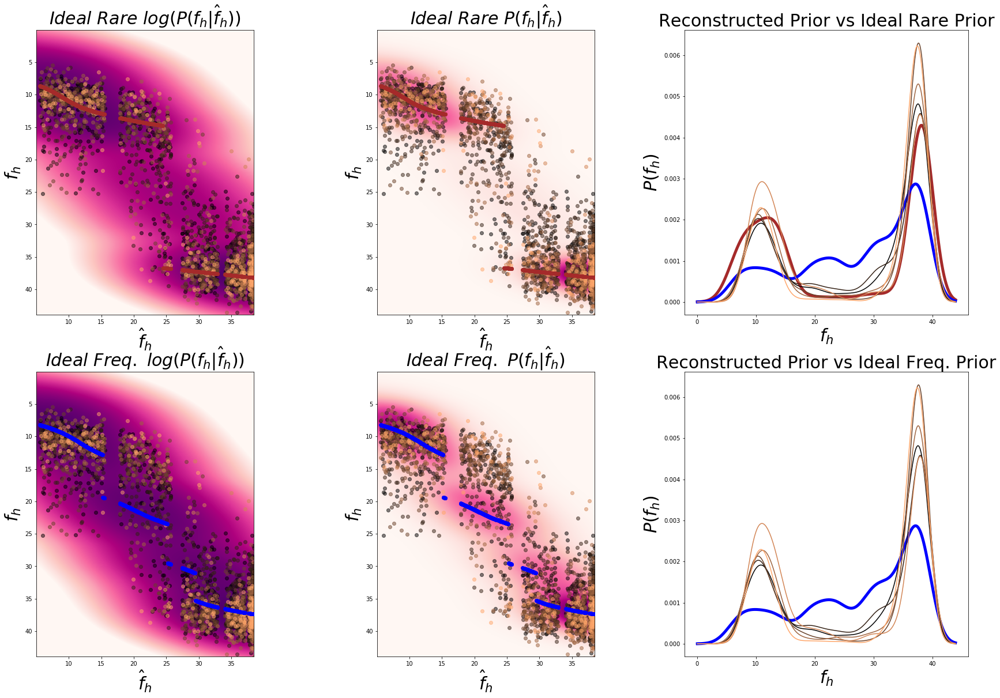

In [53]:

f,ax,rare_kl = plot_sfreg(rare_sfreg,'copper')
# f.savefig("D:\\Morph_Results\\figures\\rare_sf_reg_density.png",format="png")
# f.savefig("D:\\Morph_Results\\figures\\rare_sf_reg_density.pdf",format="pdf")

4139265.3 0.09133483782796142
4139265.4 -0.5643341849719556
4139265.5 -0.1851150203250585
4222168.1 -0.44581716289284135
4343703.1 -0.3889778469537719
trial N 400


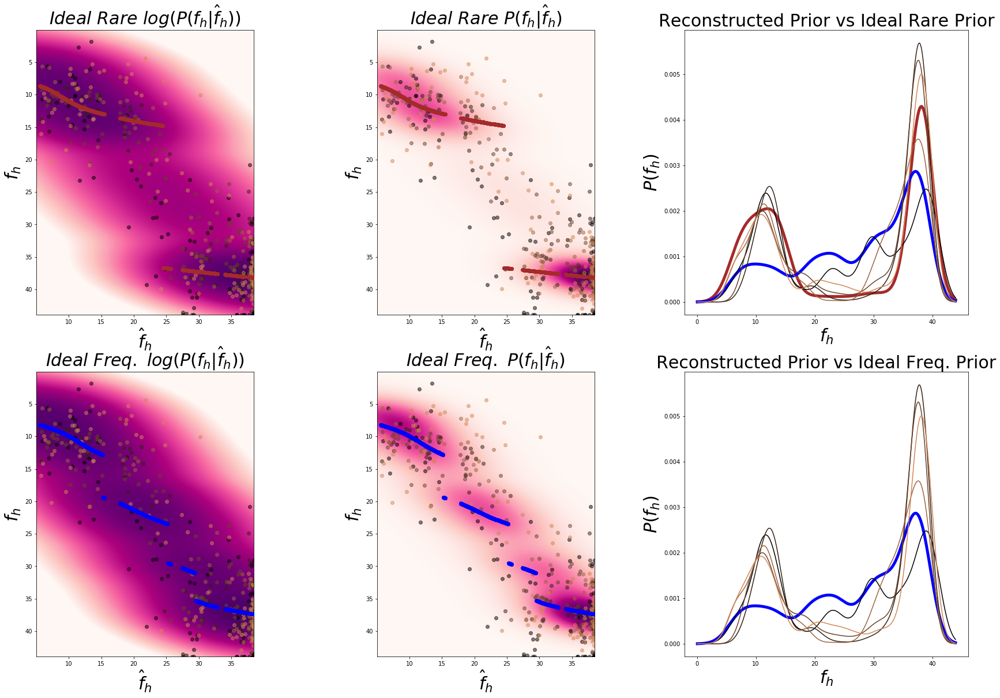

In [54]:
f,ax,rare_fs_kl = plot_sfreg(rare_fs_sfreg,'copper')
# f.savefig("D:\\Morph_Results\\figures\\rare_firstsess_sf_reg_density.pdf",format="pdf")

4222153.1 0.25383997878283915
4222153.2 0.34473937366916857
4222153.3 0.44884464565661086
4222174.1 0.3196906600752505
4222154.1 0.7519497790780952
4343702.1 0.5107335996516268
trial N 1986


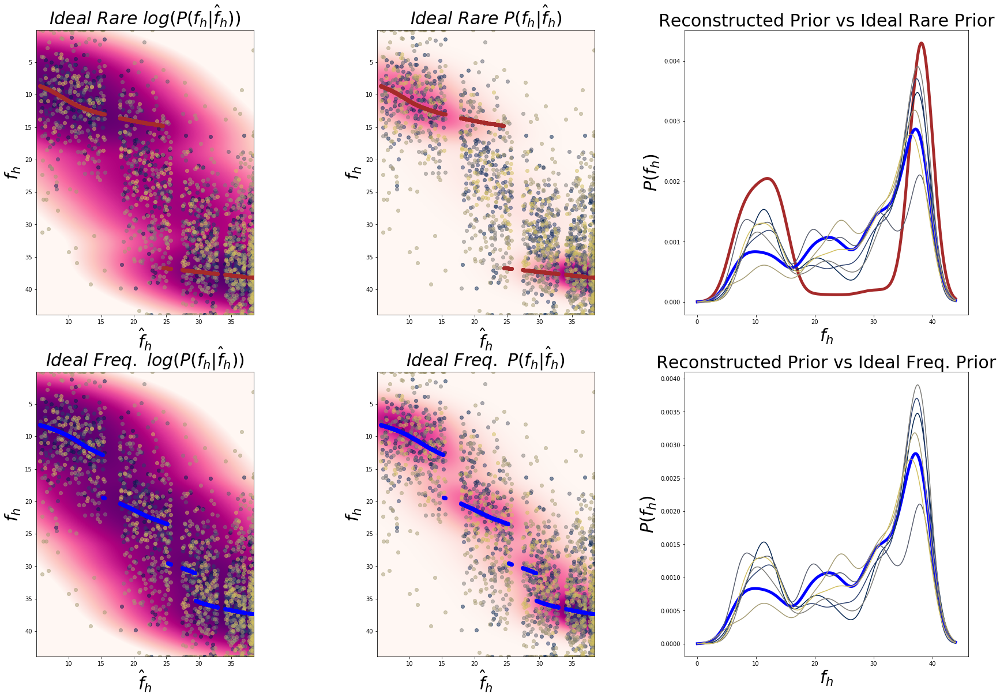

In [55]:
f,ax,freq_kl = plot_sfreg(freq_sfreg,'cividis')
# f.savefig("D:\\Morph_Results\\figures\\freq_sf_reg_density.png",format="png")
# f.savefig("D:\\Morph_Results\\figures\\freq_sf_reg_density.pdf",format="pdf")

4222153.1 0.5643342605901198
4222153.2 -0.0404849736337175
4222153.3 0.5777643179663692
4222174.1 0.48744574211488645
4222154.1 0.9228024726505817
4343702.1 0.5630380505980653
trial N 602


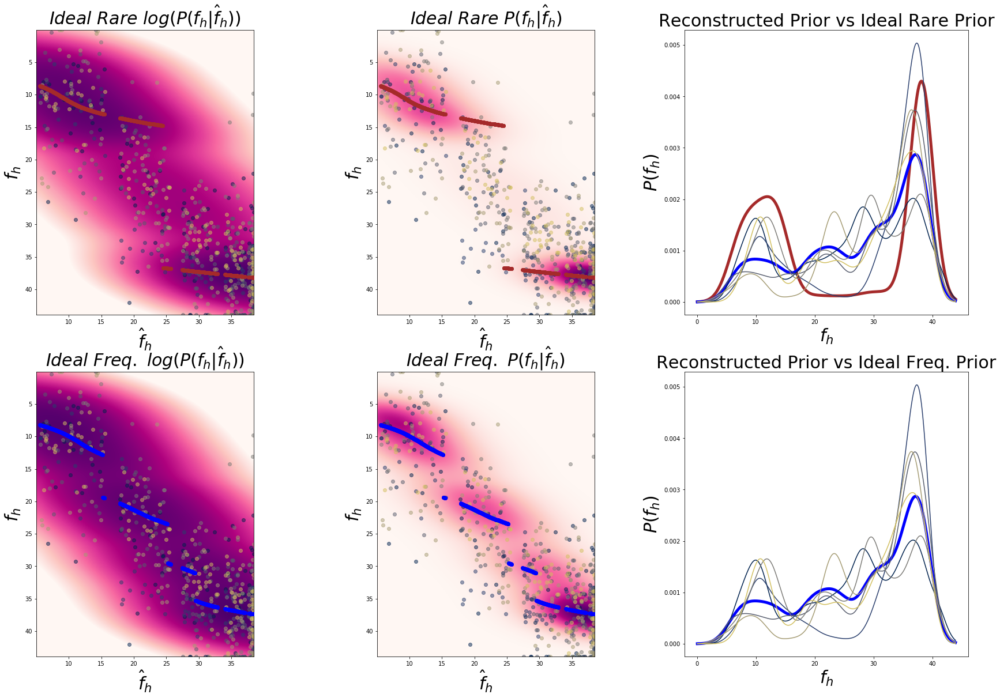

In [56]:
f,ax,freq_fs_kl = plot_sfreg(freq_fs_sfreg,'cividis')
# f.savefig("D:\\Morph_Results\\figures\\freq_firstsess_sf_reg_density.pdf",format="pdf")

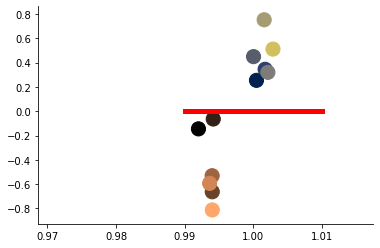

In [36]:
f,ax = plt.subplots()
ax.scatter(-.008+np.ones([6,])+.003*np.random.rand(6),np.array(rare_kl),c = plt.cm.copper(np.arange(0,6)/6.),s=200)
ax.scatter(np.ones([6,])+.003*np.random.rand(6),np.array(freq_kl),c = plt.cm.cividis(np.arange(0,6)/6.),s=200)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.plot([.99,1.01],[0,0],color='red',linewidth=5)
f.savefig("D:\\Morph_Results\\figures\\priors_KL.pdf",format="pdf")

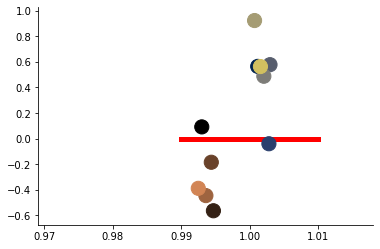

In [37]:
f,ax = plt.subplots()
ax.scatter(-.008+np.ones([5,])+.003*np.random.rand(5),np.array(rare_fs_kl),c = plt.cm.copper(np.arange(0,5)/6.),s=200)
ax.scatter(np.ones([6,])+.003*np.random.rand(6),np.array(freq_fs_kl),c = plt.cm.cividis(np.arange(0,6)/6.),s=200)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.plot([.99,1.01],[0,0],color='red',linewidth=5,zorder=-1)
f.savefig("D:\\Morph_Results\\figures\\priors_firstsess_KL.pdf",format="pdf")

In [42]:

def single_session_kldiv(sfreg,saveplots=False,rare=True,fs = False):
    kl_divs={}
    avgH = []
    for i, (mouse, res) in enumerate(sfreg.items()):
        if isinstance(res['wallmorph'],list):
            _wallmorph = np.concatenate(res['wallmorph'])
            _yhat = np.concatenate(res['rare_yhat'])
            nsess = len(res['wallmorph'])
        else:
            _wallmorph = res['wallmorph']
            _yhat = res['rare_yhat']
            nsess = 1
        kl_divs[mouse]=[]
        print(mouse)
        _x = x.ravel()
        _xmask = (_x>=-.1) & (_x<=1.1)
        HH = 0
        
        
        for sess in range(nsess):
            if isinstance(res['wallmorph'],list):
                _wm,_yh = res['wallmorph'][sess],res['rare_yhat'][sess]
            else:
                _wm,_yh = _wallmorph,_yhat
            wmsm = u.gaussian(_wm[:,np.newaxis,np.newaxis],.1,_x[np.newaxis,:,np.newaxis])
            yhsm = u.gaussian(_yh[:,np.newaxis,np.newaxis],.1,_x[np.newaxis,np.newaxis,:])
            H = np.sum(wmsm*yhsm,axis=0)
            Z=H.sum(axis=1)
            H/=H.sum(axis=1,keepdims=True)

            rare_kl,freq_kl = [],[]
            for row in range(H.shape[1]):
                if (_x[row]>=.1) and (_x[row]<=1.1):
                    if fs:
                        rare_kl.append(sp.stats.entropy(rare_fs_post[row,:],H[row,:],base=2))
                        freq_kl.append(sp.stats.entropy(freq_fs_post[row,:],H[row,:],base=2))
                    else:
                        rare_kl.append(sp.stats.entropy(rare_post[row,:],H[row,:],base=2))
                        freq_kl.append(sp.stats.entropy(freq_post[row,:],H[row,:],base=2))
            rare_kl,freq_kl = np.array(rare_kl),np.array(freq_kl)
            kl_divs[mouse].append([rare_kl.mean(),freq_kl.mean()])
        
        
            HH+=H
            f,ax = plt.subplots(1,4,figsize=[20,5])
            ax[0].imshow(H[_xmask,:].T,cmap='RdPu',extent=[ut.inv_wallmorphx(-.1),ut.inv_wallmorphx(1.1),ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])
#             ax[0].scatter(ut.inv_wallmorphx(_wm),ut.inv_wallmorphx(_yh),color='blue')
            ax[0].set_xlabel("$\hat{S}$")
            ax[0].set_ylabel("$S$")
            ax[0].set_title("$Q$ mouse %s sess %i diff KL %f" % (mouse, sess,(np.array(rare_kl).mean()-np.array(freq_kl).mean())))
            ax[1].imshow(rare_post[_xmask,:].T,cmap='RdPu',extent=[ut.inv_wallmorphx(-.1),ut.inv_wallmorphx(1.1),ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])
            ax[1].set_xlabel("$\hat{S}$")
            ax[1].set_ylabel("$S$")
            ax[1].set_title("Ideal Rare Posterior")
            ax[2].imshow(freq_post[_xmask,:].T,cmap='RdPu',extent=[ut.inv_wallmorphx(-.1),ut.inv_wallmorphx(1.1),ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])
            ax[2].set_xlabel("$\hat{S}$")
            ax[2].set_ylabel("$S$")
            ax[2].set_title("Ideal Freq Posterior")
            H_prior = H[_xmask,:].sum(axis=0)/(u.gaussian(x,sigma_likelihood,_x[:,np.newaxis])/Z[:,np.newaxis]).sum(axis=1)
            H_prior /=H_prior.sum()
            ax[3].plot(ut.inv_wallmorphx(_x),H_prior)
            ax[3].plot(ut.inv_wallmorphx(_x),rare_prior.ravel(),color='brown')
            ax[3].plot(ut.inv_wallmorphx(_x),freq_prior.ravel(),color='blue')
            ax[3].set_title("%f" % (sp.stats.entropy(rare_prior.ravel(),H_prior.ravel(),base=2)-sp.stats.entropy(freq_prior.ravel(),H_prior.ravel(),base=2)))
            if saveplots:
                if fs:
                    
                    f.savefig(os.path.join("D:\\Morph_Results\\figures\\KLDivs\\","%s_fs.pdf" % mouse),format="pdf")
                else:
                    f.savefig(os.path.join("D:\\Morph_Results\\figures\\KLDivs\\","%s_sess%i.pdf" % (mouse,sess)),format="pdf")
        
        avgH.append(HH/(sess+1))
       
    avgH = np.nansum(np.array(avgH),axis=0)
    print(avgH.shape)
    avgH/=avgH.sum(axis=1,keepdims=True)
    f,ax = plt.subplots()
#     ax.imshow(avgH.T)
    ax.imshow(avgH.T,cmap='RdPu',extent=[ut.inv_wallmorphx(-.1),ut.inv_wallmorphx(1.1),ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])
    
    rare_kl,freq_kl = [],[]
    for row in range(avgH.shape[1]):
        if (_x[row]>=.1) and (_x[row]<=1.1):
            rare_kl.append(sp.stats.entropy(rare_post[row,:],H[row,:],base=2))
            freq_kl.append(sp.stats.entropy(freq_post[row,:],H[row,:],base=2))
    rare_kl,freq_kl = np.array(rare_kl),np.array(freq_kl)
    
    ax.set_title("diff KL %f" % (np.array(rare_kl).mean()-np.array(freq_kl).mean()))
    
    
    if saveplots:
        if fs:
            if rare:
                f.savefig(os.path.join("D:\\Morph_Results\\figures\\KLDivs\\fs_rare_avg_post.pdf") ,format="pdf")
            else:
                f.savefig(os.path.join("D:\\Morph_Results\\figures\\KLDivs\\fs_freq_avg_post.pdf"),format="pdf")
        else:
            
            if rare:
                f.savefig(os.path.join("D:\\Morph_Results\\figures\\KLDivs\\rare_avg_post.pdf") ,format="pdf")
            else:
                f.savefig(os.path.join("D:\\Morph_Results\\figures\\KLDivs\\freq_avg_post.pdf"),format="pdf")
    
    return kl_divs


4139265.3
4139265.4
4139265.5
4222168.1
4343703.1


C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


4343706


C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

(1000, 1000)


C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


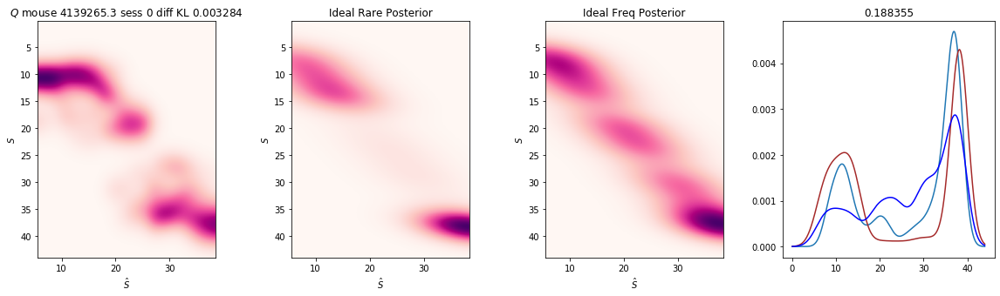

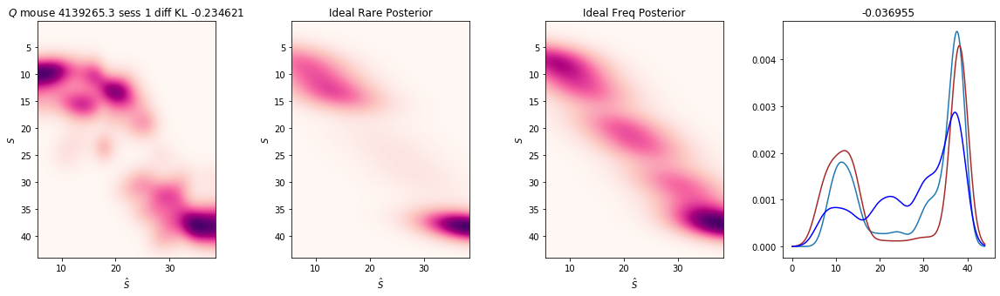

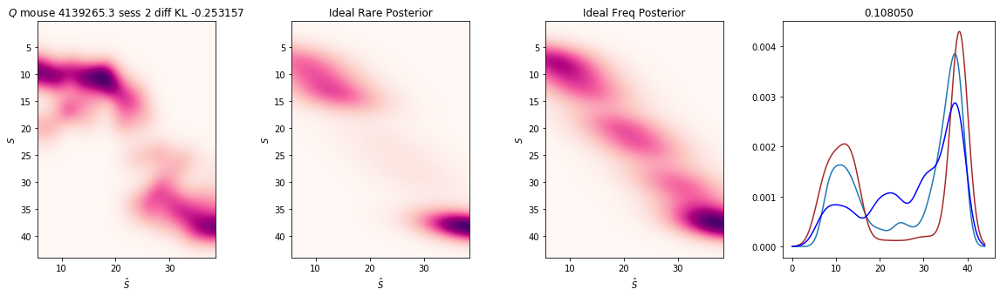

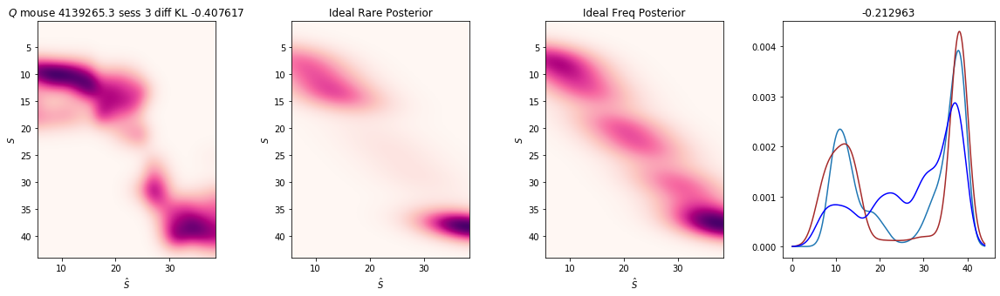

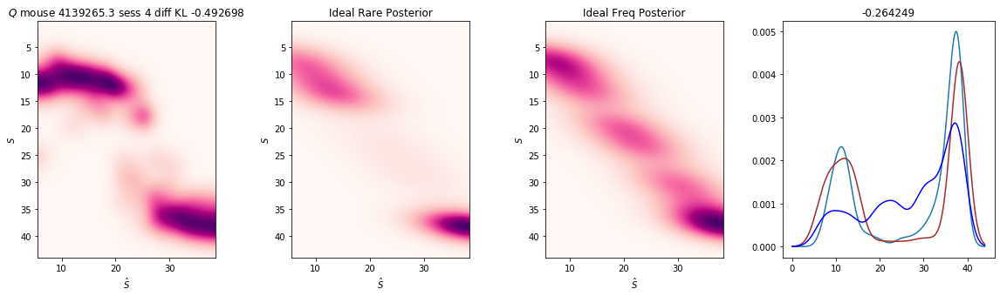

...

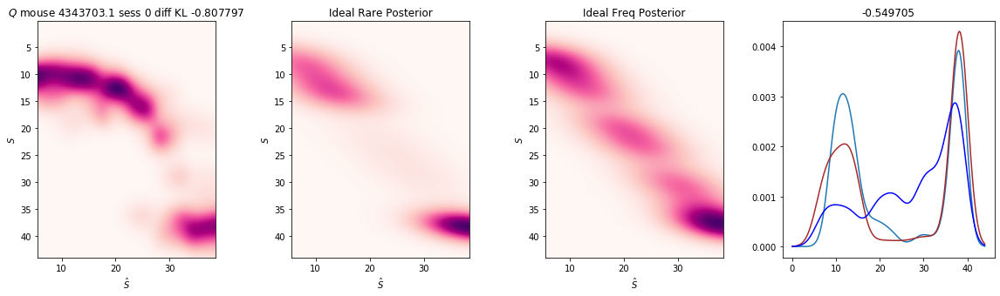

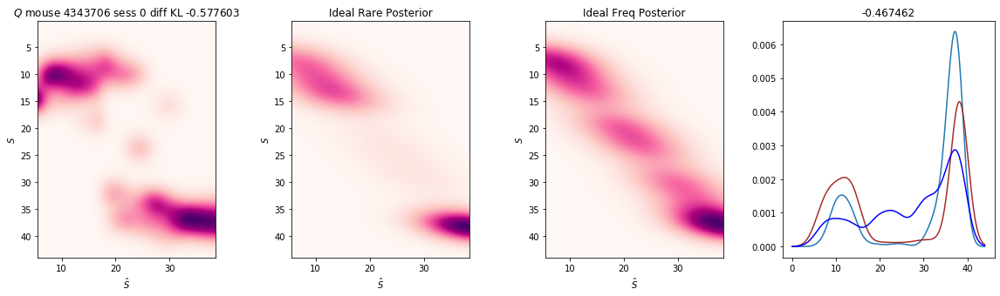

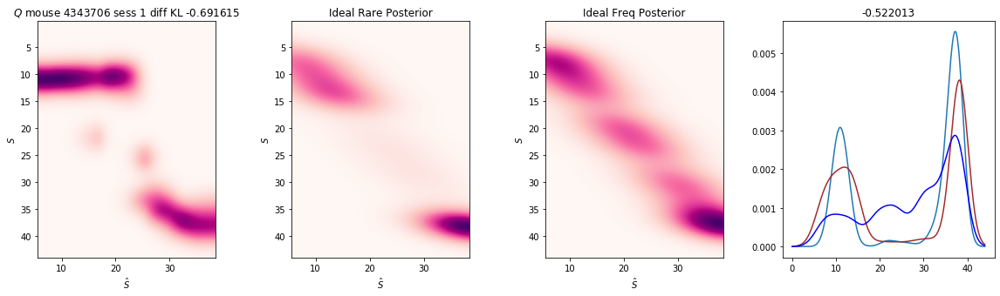

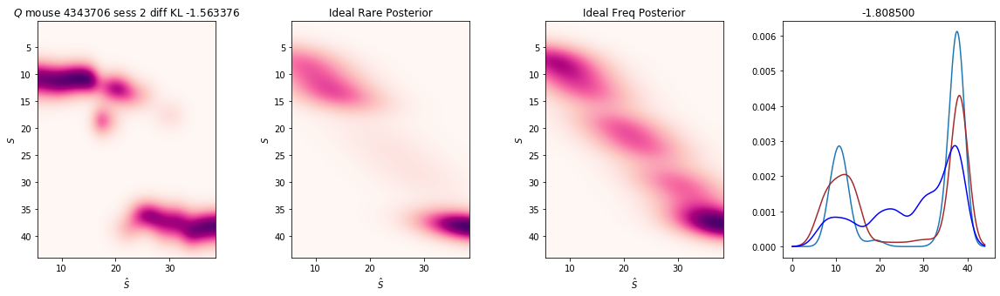

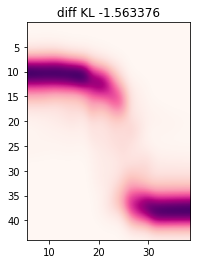

In [43]:
rare_kldivs = single_session_kldiv(rare_sfreg,saveplots=True,rare=True)

4139265.3
4139265.4
4139265.5
4222168.1
4343703.1
(1000, 1000)


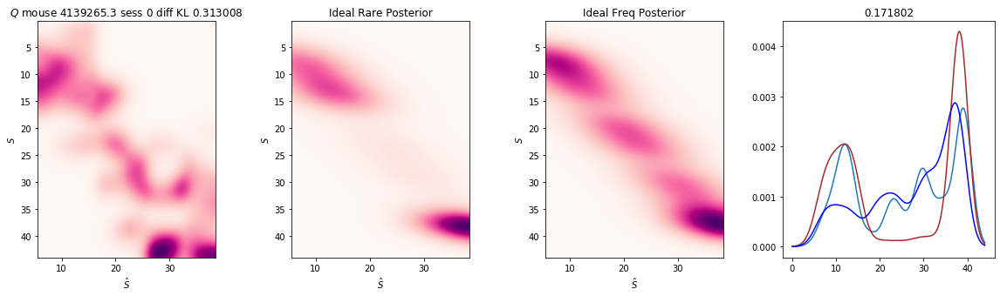

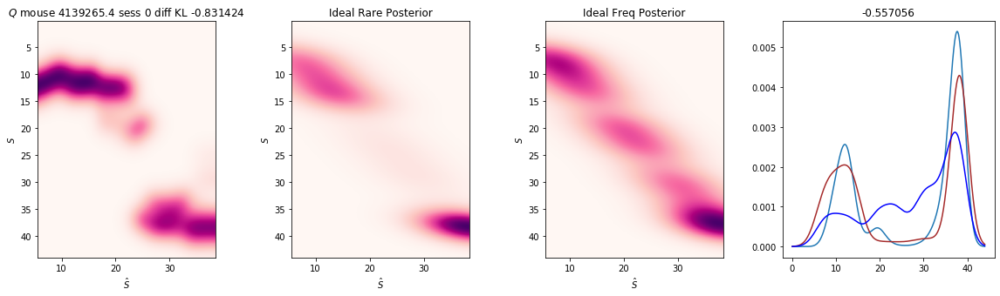

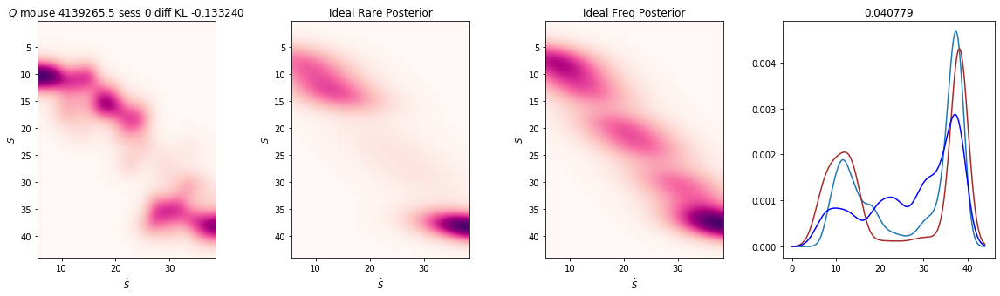

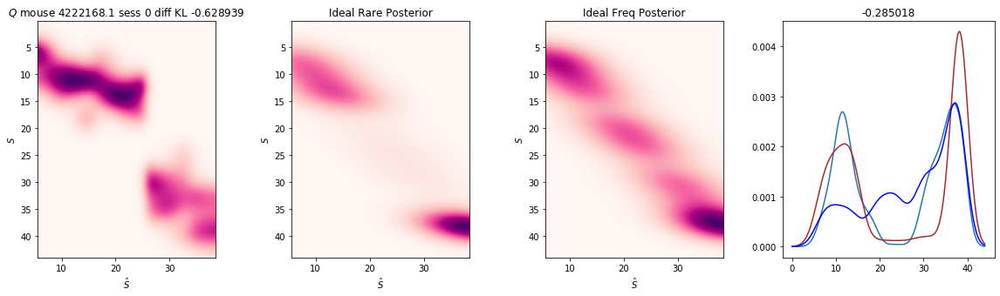

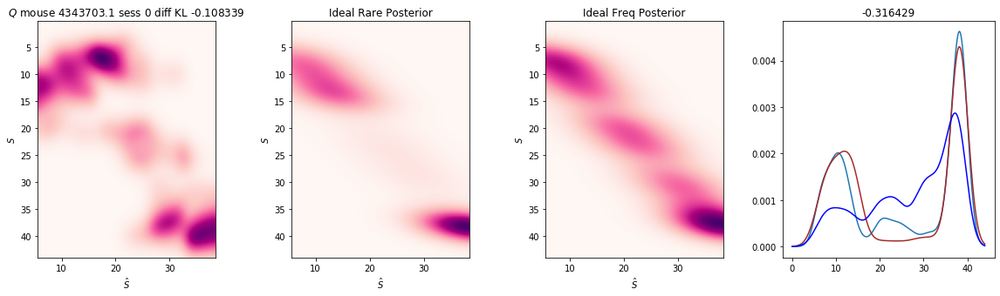

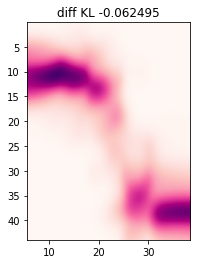

In [44]:
rare_fs_kldivs = single_session_kldiv(rare_fs_sfreg,saveplots=True,rare=True,fs=True)

4222153.1
4222153.2
4222153.3
4222174.1
4222154.1
4343702.1


C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


(1000, 1000)


C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


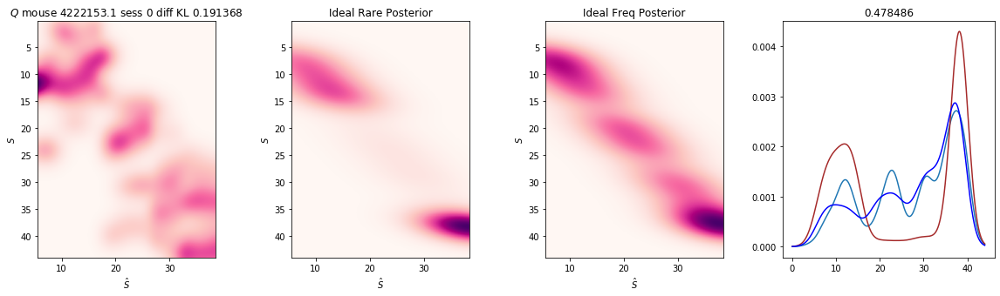

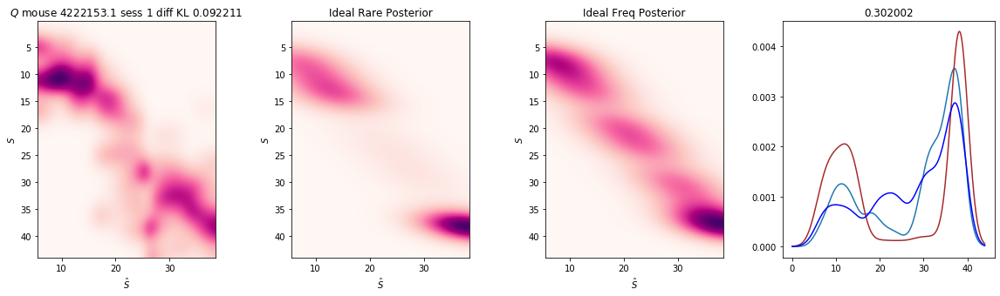

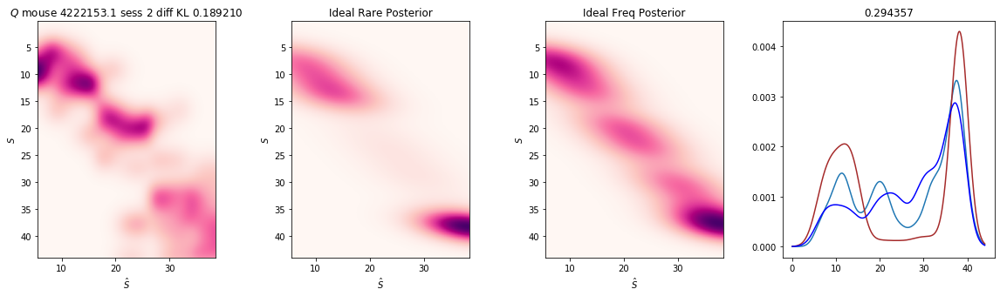

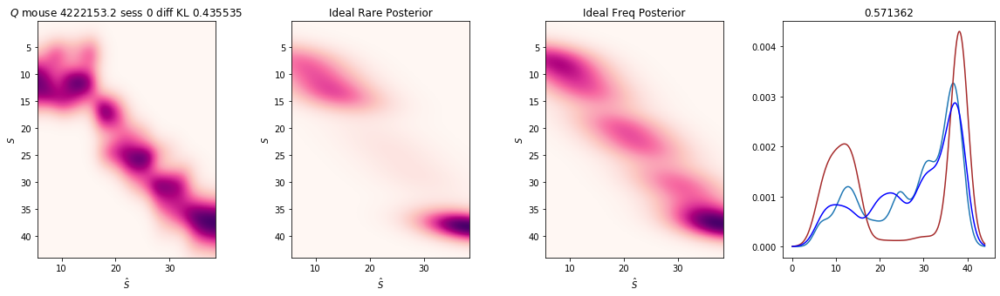

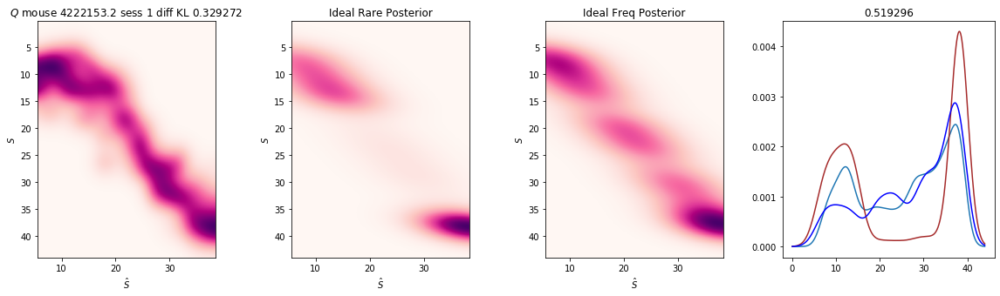

...

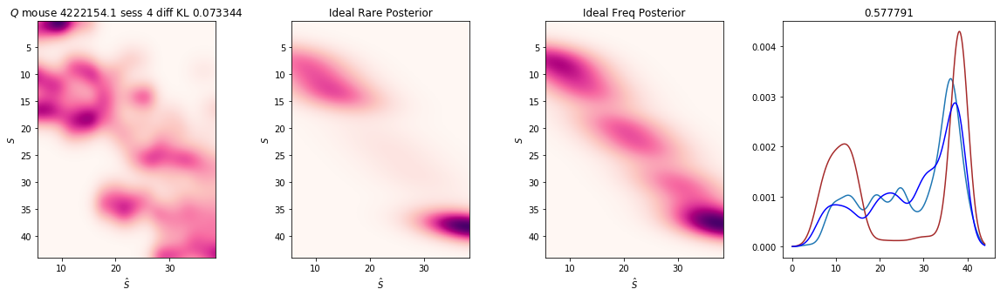

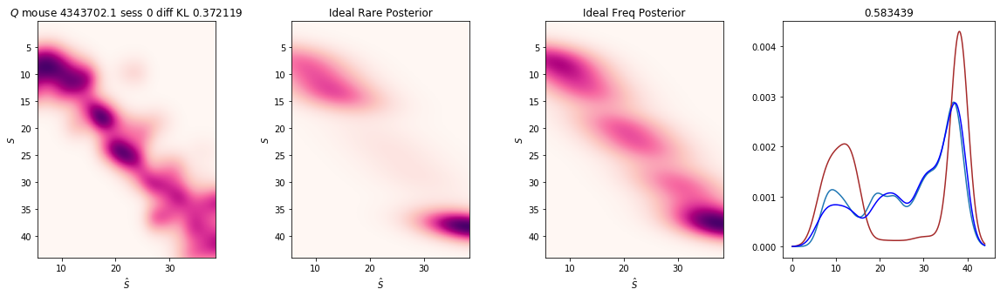

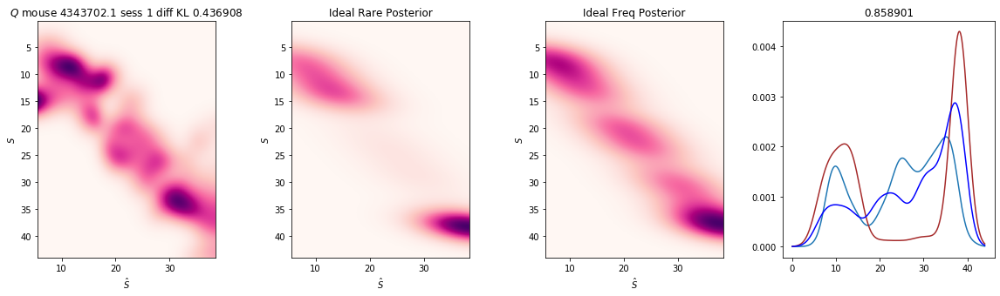

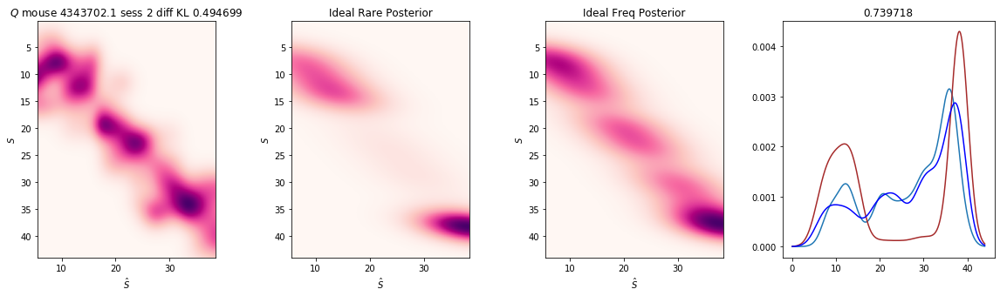

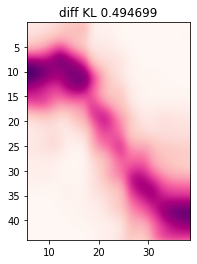

In [45]:
freq_kldivs = single_session_kldiv(freq_sfreg,saveplots=True,rare=False)

4222153.1
4222153.2
4222153.3
4222174.1
4222154.1
4343702.1
(1000, 1000)


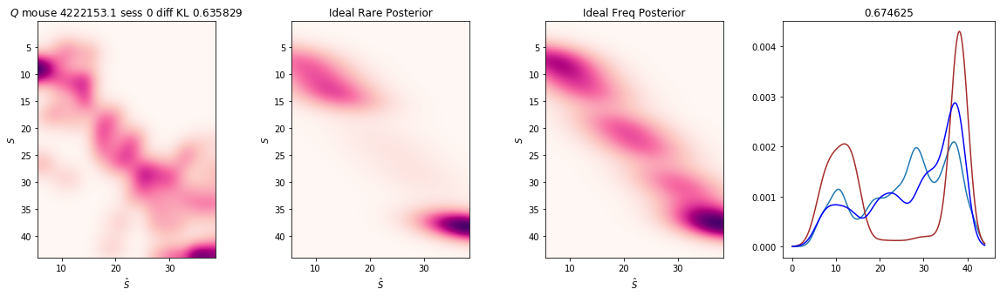

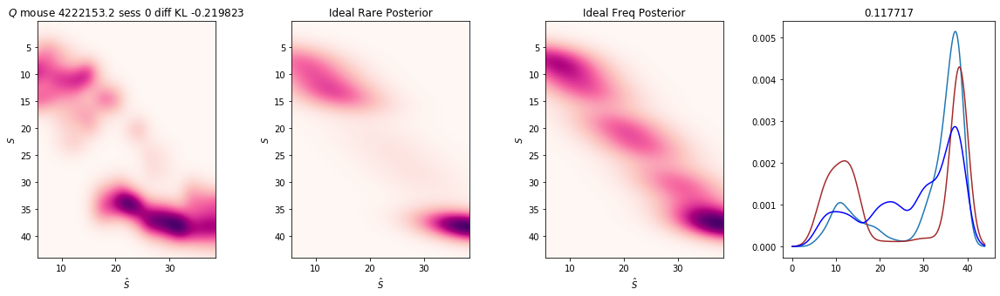

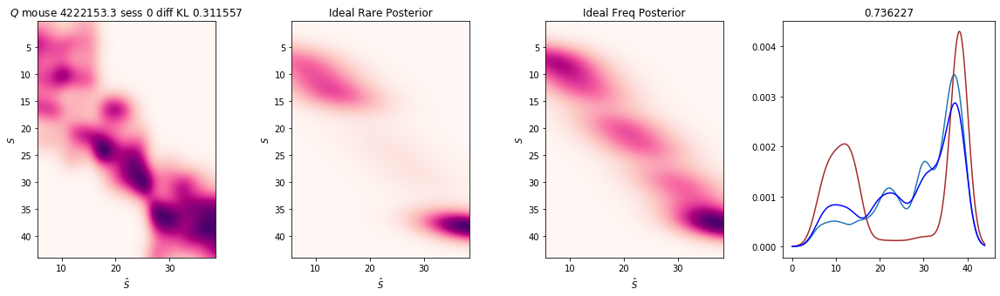

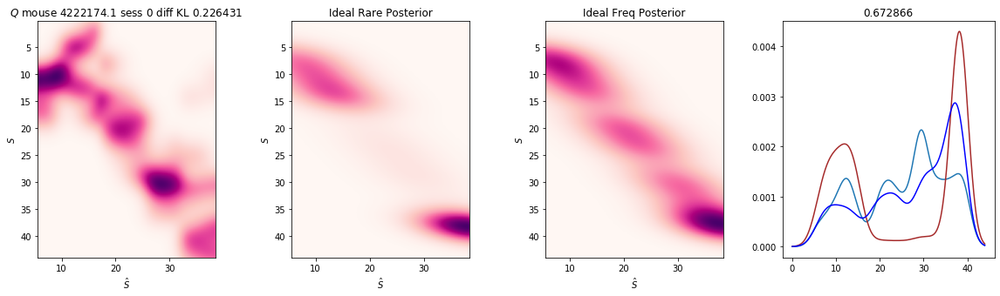

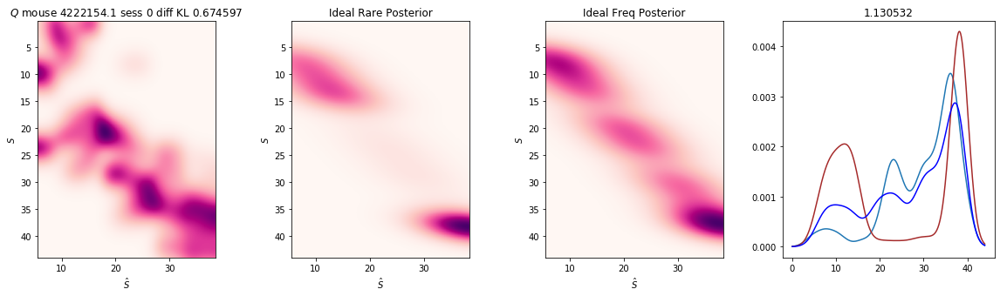

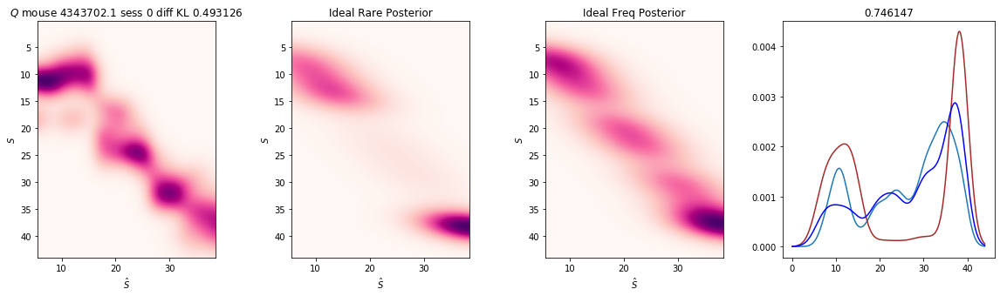

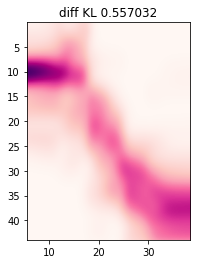

In [46]:
freq_fs_kldivs = single_session_kldiv(freq_fs_sfreg,saveplots=True,rare=False,fs=True)

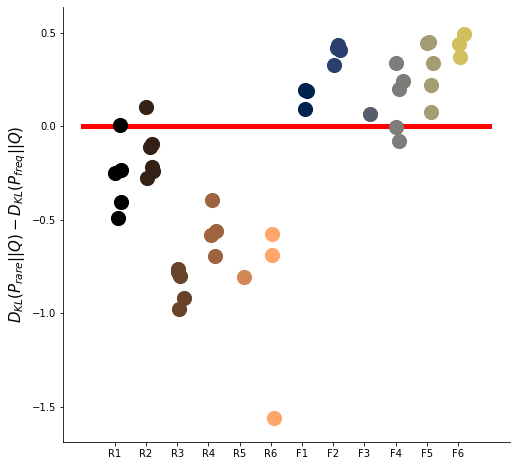

In [47]:
f,ax = plt.subplots(figsize=[8,8])
for i,(mouse,kl) in enumerate(rare_kldivs.items()):
    kl = np.array(kl)
    diff = kl[:,0]-kl[:,1]
    ax.scatter(i+.25*np.random.rand(diff.shape[0]),diff,color=plt.cm.copper(i/6.),s=200)
for j, (mouse,kl) in enumerate(freq_kldivs.items()):
    kl = np.array(kl)
    diff = kl[:,0]-kl[:,1]
    ax.scatter(i+1+j+.25*np.random.rand(diff.shape[0]),diff,color=plt.cm.cividis(j/6.),s=200)

ax.set_xticks(np.arange(j+1+i+1))
ax.set_xticklabels(['R1','R2','R3','R4','R5','R6','F1','F2','F3','F4','F5','F6'])
ax.plot([-1,12],[0,0],color='red',linewidth=5,zorder=-1)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel("$  D_{KL}(  P_{rare}  ||  Q  ) - D_{KL} (  P_{freq}  ||  Q  ) $",fontsize=15)
f.savefig("D:\\Morph_Results\\figures\\KLDivs\\Single_Session_Diffs.pdf",format="pdf")

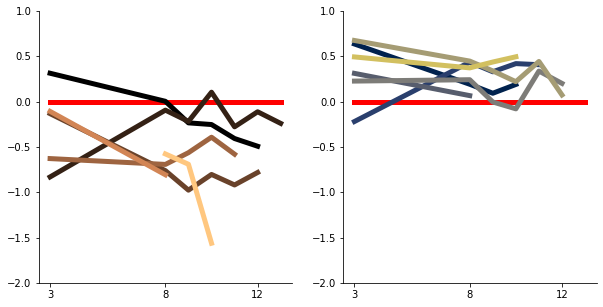

In [50]:
f,ax = plt.subplots(1,2,figsize=[10,5])
for i,(mouse,kl) in enumerate(rare_kldivs.items()):
    kl = np.array(kl)
    diff = kl[:,0]-kl[:,1]
    if mouse != '4343706':
        diff0 = rare_fs_kldivs[mouse][0][0]-rare_fs_kldivs[mouse][0][1]
        ax[0].plot(np.append(3,np.arange(8,8+diff.shape[0])), np.append(diff0,diff),color=plt.cm.copper(i/6.),linewidth=5)
    else:
        ax[0].plot(np.arange(8,8+diff.shape[0]),diff,color=plt.cm.copper(1.),linewidth=5)
ax[0].set_ylim([-2,1])
ax[0].set_xticks([3,8,12])
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)
ax[0].plot([3,13],[0,0],color='red',linewidth=5,zorder=-1)
        
for i,(mouse,kl) in enumerate(freq_kldivs.items()):
    kl = np.array(kl)
    diff = kl[:,0]-kl[:,1]
    
    diff0 = freq_fs_kldivs[mouse][0][0]-freq_fs_kldivs[mouse][0][1]
    ax[1].plot(np.append(3,np.arange(8,8+diff.shape[0])), np.append(diff0,diff),color=plt.cm.cividis(i/6.),linewidth=5)
ax[1].set_ylim([-2,1])
ax[1].set_xticks([3,8,12])
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
ax[1].plot([3,13],[0,0],color='red',linewidth=5,zorder=-1)
f.savefig("D:\\Morph_Results\\figures\\KLDivs\\Single_Session_Diffs_V_Time.pdf",format="pdf")

In [24]:
print(rare_sfreg.keys())

dict_keys(['4139265.3', '4139265.4', '4139265.5', '4222168.1', '4343703.1', '4343706'])


In [25]:
print(rare_sfreg['4139265.5'].keys())

dict_keys(['wallmorph', 'rare_ytarget', 'freq_ytarget', 'rare_yhat', 'freq_yhat', 'priors', 'priors_uc', 'sf', 'sfhat', 'wallmorph_uc'])


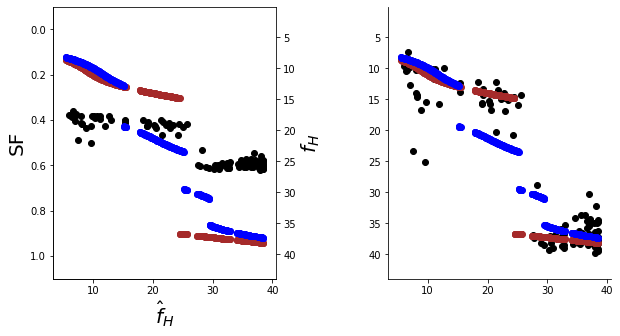

In [119]:
f,ax = plt.subplots(1,2,figsize=[10,5])
f.subplots_adjust(wspace=.5)

mask = np.ones(xx.shape)>0
mask[(xx<ut.wallmorphx(-.1)) | ((xx>ut.wallmorphx(.1))&(xx<ut.wallmorphx(.15))) | ((xx>ut.wallmorphx(.35))&(xx<ut.wallmorphx(.4))) | ((xx>ut.wallmorphx(.6))&(xx<ut.wallmorphx(.65))) |((xx>ut.wallmorphx(.85))&(xx<ut.wallmorphx(.9))) |(xx>ut.wallmorphx(1.1))]=False


ax[0].scatter(ut.inv_wallmorphx(rare_sfreg['4139265.5']['wallmorph'][-2]),rare_sfreg['4139265.5']['sf'][-2],color='black')
# mask = np.ones(xx.shape)>0
# mask[(xx<-.1) | ((xx>.1)&(xx<.15)) | ((xx>.35)&(xx<.4))| ((xx>.6)&(xx<.65)) |((xx>.85)&(xx<.9)) |(xx>1.1)]=False

ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

# ax[0].scatter(ut.inv_wallmorphx(xx[mask]),rare_ytarget[mask],color='brown')
# ax[0].scatter(ut.inv_wallmorphx(xx[mask]),freq_ytarget[mask],color='blue')

# ax[0].set_ylim([.65,.3])
# ax[0].set_ylim([ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])
axx = ax[0].twinx()
axx.scatter(ut.inv_wallmorphx(xx[mask]),ut.inv_wallmorphx(rare_ytarget[mask]),color='brown')
axx.scatter(ut.inv_wallmorphx(xx[mask]),ut.inv_wallmorphx(freq_ytarget[mask]),color='blue')
# axx.scatter(rare_sfreg['4139265.5']['wallmorph_uc'][-2],rare_sfreg['4139265.5']['sf'][-2],color='black',alpha=0)

ax[0].set_ylim([1.1,-.1])
axx.set_ylim([ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])




ax[1].scatter(ut.inv_wallmorphx(rare_sfreg['4139265.5']['wallmorph'][-2]),ut.inv_wallmorphx(rare_sfreg['4139265.5']['rare_yhat'][-2]),color='black')
ax[1].scatter(ut.inv_wallmorphx(xx[mask]),ut.inv_wallmorphx(rare_ytarget[mask]),color='brown')
ax[1].scatter(ut.inv_wallmorphx(xx[mask]),ut.inv_wallmorphx(freq_ytarget[mask]),color='blue')
ax[1].set_ylim([ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)


ax[0].set_xlabel("$\hat{f}_H$",fontsize=20)
ax[0].set_ylabel("SF",fontsize=20)
axx.set_ylabel("$f_H$",fontsize=20)

f.savefig("D:\\Morph_Results\\figures\\sfreg_example_rare.pdf",format="pdf")

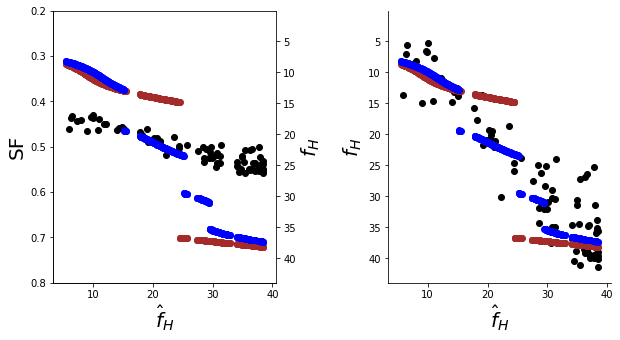

In [121]:
f,ax = plt.subplots(1,2,figsize=[10,5])
f.subplots_adjust(wspace=.5)

mask = np.ones(xx.shape)>0
mask[(xx<ut.wallmorphx(-.1)) | ((xx>ut.wallmorphx(.1))&(xx<ut.wallmorphx(.15))) | ((xx>ut.wallmorphx(.35))&(xx<ut.wallmorphx(.4))) | ((xx>ut.wallmorphx(.6))&(xx<ut.wallmorphx(.65))) |((xx>ut.wallmorphx(.85))&(xx<ut.wallmorphx(.9))) |(xx>ut.wallmorphx(1.1))]=False


ax[0].scatter(ut.inv_wallmorphx(freq_sfreg['4222153.2']['wallmorph'][-1]),freq_sfreg['4222153.2']['sf'][-1],color='black')
# mask = np.ones(xx.shape)>0
# mask[(xx<-.1) | ((xx>.1)&(xx<.15)) | ((xx>.35)&(xx<.4))| ((xx>.6)&(xx<.65)) |((xx>.85)&(xx<.9)) |(xx>1.1)]=False

ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

# ax[0].scatter(ut.inv_wallmorphx(xx[mask]),rare_ytarget[mask],color='brown')
# ax[0].scatter(ut.inv_wallmorphx(xx[mask]),freq_ytarget[mask],color='blue')

# ax[0].set_ylim([.65,.3])
# ax[0].set_ylim([ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])
axx = ax[0].twinx()
axx.scatter(ut.inv_wallmorphx(xx[mask]),ut.inv_wallmorphx(rare_ytarget[mask]),color='brown')
axx.scatter(ut.inv_wallmorphx(xx[mask]),ut.inv_wallmorphx(freq_ytarget[mask]),color='blue')
# axx.scatter(rare_sfreg['4139265.5']['wallmorph_uc'][-2],rare_sfreg['4139265.5']['sf'][-2],color='black',alpha=0)

ax[0].set_ylim([.8,.2])
axx.set_ylim([ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])




ax[1].scatter(ut.inv_wallmorphx(freq_sfreg['4222153.2']['wallmorph'][-1]),ut.inv_wallmorphx(freq_sfreg['4222153.2']['rare_yhat'][-1]),color='black')
ax[1].scatter(ut.inv_wallmorphx(xx[mask]),ut.inv_wallmorphx(rare_ytarget[mask]),color='brown')
ax[1].scatter(ut.inv_wallmorphx(xx[mask]),ut.inv_wallmorphx(freq_ytarget[mask]),color='blue')
ax[1].set_ylim([ut.inv_wallmorphx(1.3),ut.inv_wallmorphx(-.3)])
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)


ax[0].set_xlabel("$\hat{f}_H$",fontsize=20)
ax[0].set_ylabel("SF",fontsize=20)
axx.set_ylabel("$f_H$",fontsize=20)

ax[1].set_ylabel("$f_H$",fontsize=20)
ax[1].set_xlabel("$\hat{f}_H$",fontsize=20)

f.savefig("D:\\Morph_Results\\figures\\sfreg_example_freq.pdf",format="pdf")